In [1]:
## 2026.02.11 using FineST env
## 2026.02.12 vilization cell type of each ROI
## 2026.03.04 woody_pro:: upload the HE-StarDist embedding and predict the cell type of NCRT_tumor1  
## 2026.03.06 woody_pro:: clearn code 
## 2026.03.13 update cell type level1: nanually make codex_meta_celltype_level1.csv 
## 2026.03.16 use valis to make registration [dont try]
## 2026.03.18 delete two subtypes, adjust scale factor by batch
## 2026.03.19 Train and using NCRT_train.ipynb
## 2026.03.23 Adjust file name and path, then adjust model to use level1 and level2, make model_train_validate.ipynb
## 2026.04.04 woody_pro: SeededNTM; make processing for x, add cv in training for tumor1
## 2026.04.06 Adjust loss function
## 2026.04.14 LLY update using UNI method, based on LOGO CV

In [6]:
import os
# Before other imports: PyTorch/torch.distributed may use /tmp; set NCRT_TMPDIR if quota is tight.
_nrtc_tmp = os.environ.get("NCRT_TMPDIR", os.path.join(os.path.expanduser("~"), "ssd2", "tmp"))
try:
    os.makedirs(_nrtc_tmp, exist_ok=True)
    os.environ["TMPDIR"] = _nrtc_tmp
    os.environ["TEMP"] = _nrtc_tmp
    os.environ["TMP"] = _nrtc_tmp
    import tempfile as _tf_nb
    _tf_nb.tempdir = _nrtc_tmp
except OSError:
    pass

import sys
import importlib
import pandas as pd
from pathlib import Path

## Add the code directory to Python path
path = '/home/lingyu/ssd2/Python/'
code_dir = f'{path}Hist2Pheno/code/Hist2Pheno_pkg/'
if code_dir not in sys.path:
    sys.path.insert(0, code_dir)

## Import (or reload) base module
# Do NOT `import model` — that binds the name ``model`` to the *module* and will shadow
# your trained ``torch.nn.Module`` after ``globals().update(LP)`` when this cell is re-run.
import base
import plot
import model as model_pkg
## Impost：Force reload base.py
importlib.reload(base)
importlib.reload(plot)
importlib.reload(model_pkg)

## Re-import the function (otherwise, still be old_version).
from base import (
    get_celltype_coords,
    divide_into_rois_by_parent,
    get_pixel_size,
    visualize_roi_cells,
    visualize_all_rois_with_he,
    visualize_all_rois,
    extract_and_save_celltype_by_tumorid,
    transformation_matrix_properties,
    invert_transformation_matrix,
    align_pcf_to_he_coordinates,
    add_pixel_coords,
    verify_transformation_alignment,
    merge_coordinates,
    analyze_and_filter_classes_by_gap,
    ImprovedMLPClassifier,
    load_embeddings,
    match_embeddings,
    prepare_matched_embeddings,
    evaluate,
    create_dataloaders,
    train_model,
    CellTypeDataset,
    evaluate_and_plot_on_all_data,
    align_matrix,
    match_StarCoords2ROI,
    match_celltype2stardist,
    merge_celltype_level12,
    make_PCF2HE_alignment,
    load_cell_pixcoords,load_hist_embeddings,
    match_hist2cell_matrix,
    make_PCF2HE2StarDist_alignment,
    save_hce_validation_metrics,
    split_train_test,
    prepare_data_leave_one_group_out,
    spatial_tile_groups_for_logo,
    loader_train_test,
    first_pth_tensor
    
)

from plot import (
    plot_celltype_distribution,
    visualize_all_celltype_distributions,
    plot_celltype_distribution,
    plot_celltype_spatial_distribution,
    plot_PCF_HE_counts,
    plot_WSI_counts,
    plot_cell_area_histogram,
    plot_confusion_matrix,
    plot_level1_spatial_distribution,
    plot_per_class_f1,
    plot_per_class_accuracy,
    plot_level1_accuracy_from_level2_predictions
)

from model import (
    build_mlp_classifier,
    get_best_checkpoint_path,
    sync_best_mlp_from_logo_fold,
    train_and_save_model,
    infer_input_dim_and_num_classes,
    mode_validation,
    load_model_for_predict,
    train_and_save_model_from_split,
    mode_validation_from_split,
    train_hce_leave_one_group_out_cv,
    run_logo_cv_and_load_best_model,
    report_logo_cv_means_and_insample_eval,
    run_logo_cv_with_insample_report,
    run_stratified_kfold_cv_with_insample_report
)

## Import HAS_OPENSLIDE and HAS_TIFFFILE from base module for use in notebook
HAS_OPENSLIDE = base.HAS_OPENSLIDE
HAS_TIFFFILE = base.HAS_TIFFFILE

## Also import openslide module if available (needed for direct use in some cells)
if HAS_OPENSLIDE:
    import openslide
else:
    openslide = None

try:
    import tifffile
except ImportError:
    tifffile = None

print("Successfully reloaded functions from base.py")
print(f"openslide: {HAS_OPENSLIDE}, tifffile: {HAS_TIFFFILE}")


## reset pathway
os.chdir(f'{path}Hist2Pheno/data/CODEX/ESCC')
therapy_data = 'NCRT'
image_feature = f'sc_{therapy_data}'
# therapy_model = f'{therapy_data}_project_tumor1'
therapy_model = f'{therapy_data}_project_tumor1_UNI'
segment_data1 = f'{therapy_data}_project - seg 1-14'
segment_data2 = f'{therapy_data}_project - seg 15-28'
export_data = 'export'
save_result = 'result'

stardist_data = 'StarDist_Segment'
transfer_data = 'he_cell_coords'
qupath_corner = 'QupathCorners'

Successfully reloaded functions from base.py
openslide: False, tifffile: True


In [3]:
## CUDA/CPU sanity check for training setup
import os
import sys
import torch

# Default physical GPU index 2 (torch device string cuda:2). Override without editing:
#   export NCRT_CUDA_DEVICE=0
CUDA_DEVICE_INDEX = int(os.environ.get("NCRT_CUDA_DEVICE", "2"))

print(sys.executable)
print(
    f"torch {torch.__version__} | built with CUDA: {torch.version.cuda} | "
    f"cuda.is_available: {torch.cuda.is_available()}"
)

if torch.cuda.is_available():
    n_gpu = torch.cuda.device_count()
    if CUDA_DEVICE_INDEX < 0 or CUDA_DEVICE_INDEX >= n_gpu:
        raise RuntimeError(
            f"CUDA_DEVICE_INDEX={CUDA_DEVICE_INDEX} out of range; only {n_gpu} GPU(s) visible."
        )
    torch.cuda.set_device(CUDA_DEVICE_INDEX)
    device = torch.device(f"cuda:{CUDA_DEVICE_INDEX}")
    # Reproducibility-first: use deterministic cuDNN settings.
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    amp_scaler = torch.amp.GradScaler("cuda")  # AMP only on CUDA
    print(
        f"Using device cuda:{CUDA_DEVICE_INDEX} | "
        f"{torch.cuda.get_device_name(CUDA_DEVICE_INDEX)}"
    )
else:
    allow_cpu = os.environ.get("NCRT_ALLOW_CPU_TRAIN", "").strip().lower() in ("1", "true", "yes")
    if allow_cpu:
        device, amp_scaler = torch.device("cpu"), None
        print("WARNING: CUDA unavailable, training on CPU (set NCRT_ALLOW_CPU_TRAIN=1).")
    else:
        raise RuntimeError(
            "CUDA unavailable. Please use a CUDA-enabled PyTorch build, "
            "or set NCRT_ALLOW_CPU_TRAIN=1 to run on CPU."
        )

if device.type == "cuda":
    print(f"device: {device} | {torch.cuda.get_device_name(CUDA_DEVICE_INDEX)}")
else:
    print(f"device: {device}")



## Reproducibility setup (run this first after kernel restart)
import os
import random
import numpy as np
import torch

SEED = 42
os.environ["PYTHONHASHSEED"] = str(SEED)
# Needed by CUDA for deterministic GEMM on some ops.
os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)

# Enforce deterministic behavior (may reduce speed).
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
torch.use_deterministic_algorithms(True)

print(f"Reproducibility configured with SEED={SEED}")

/ssd2/users/lingyu/conda_envs/SeededNTM/bin/python
torch 2.9.1+cu130 | built with CUDA: 13.0 | cuda.is_available: True
Using device cuda:2 | NVIDIA RTX PRO 6000 Blackwell Server Edition
device: cuda:2 | NVIDIA RTX PRO 6000 Blackwell Server Edition
Reproducibility configured with SEED=42


In [4]:
hist_embedding_dir = Path(f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/ImgEmbeddings_tumor1/sc_pth_16_16')
tensor = first_pth_tensor(hist_embedding_dir)

Found file: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/ImgEmbeddings_tumor1/sc_pth_16_16/sc_NCRT_8581.601852334961_4044.732986963536.pth
Loaded type: <class 'tuple'>
tensor.shape of the first .pth file: torch.Size([1, 1, 1024])


/home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/ESCC/NCRT/NCRT_project_tumor1/ImgEmbeddings_tumor1/sc_pth_16_16/sc_NCRT_8581.601852334961_4044.732986963536.pth

<class 'tuple'>

torch.Size([1, 1, 384])

## Cell Type Classification Model

Leave-one-group-out (LOGO) CV (sklearn `LeaveOneGroupOut` idea).  
Uses npz `matched_features_tumor1_logo.npz` with a `TumorID` column when available. If that column is constant for all rows (typical for tumor1-only CSV), the notebook **falls back to spatial tiles** on `X_pix_HE`×`Y_pix_HE` (`spatial_tile_groups_for_logo`).

In [7]:
## Match embeddings with celltype data by coordinates (stratified_kfold path)
cell_coords_path = f'{path}Hist2Pheno/data/CODEX/ESCC/he_cell_coords/{therapy_data}_CellPixCoords_tumor1.csv'
hist_embedding_dir = Path(f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/ImgEmbeddings_tumor1/sc_pth_16_16')
# Keep the same cache naming used by cv_mode=stratified_kfold in the script.
matched_features_path = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/matched_features_tumor1_level012.npz'
# Coordinate matching tolerance in pixels (float supported).
# base.py now handles optional `celltype_level1` automatically.

level1_name = "celltype_level1"  # column used for y_level1
match_tolerance = 1.0
X, y, y_level1, y_level0, y_level01, y_level12, X_coords_matched = match_hist2cell_matrix(
    cell_coords_path=cell_coords_path,
    hist_embedding_dir=hist_embedding_dir,
    matched_features_path=matched_features_path,
    coord_cols=('X_pix_HE', 'Y_pix_HE'),
    tolerance=match_tolerance,
    pth_prefix=image_feature,
    level1_name=level1_name,
)

# match_tolerance = 1.0
# X, y, y_level1, X_coords_matched = match_hist2cell_matrix(
#     cell_coords_path=cell_coords_path,
#     hist_embedding_dir=hist_embedding_dir,
#     matched_features_path=matched_features_path,
#     coord_cols=('X_pix_HE', 'Y_pix_HE'),
#     tolerance=match_tolerance,
#     pth_prefix=image_feature,
# )

if X_coords_matched is not None:
    print(f"Matched coordinates shape: {X_coords_matched.shape}")

Loading celltype Ground Truth ...
  Loaded 80303 cells
  Cell types: 40 unique types



Loading HIPT embeddings (full scan: 80,303 .pth files, cap=400,000; skipping selective path probe).
  Loading embeddings...


Loading .pth files (workers=16): 100%|██████████| 80303/80303 [01:23<00:00, 960.60it/s] 


  Successfully loaded 80303 embeddings
  Embedding dimension: (1024,)

Matching embeddings with celltype data (this may take a few minutes)...
  Using specified coordinates: X_pix_HE, Y_pix_HE
  Building KDTree for embeddings: 80,303 points
  KDTree matched 80,303 / 80,303 cells (100.00%).
  Matched 80303 cells out of 80303
  Match rate: 100.00%

Data shape:
  X (features): (80303, 1024)
  y (labels): (80303,)
  y_level1 (labels): (80303,)
  Number of y classes: 40
  Number of y_level1 classes: 7

Saving matched data for future use...
  ✓ Saving y_level0 from column 'celltype_level0'
  ✓ Saving y_level01 from column 'celltype_level01'
  ✓ Saving y_level12 from column 'celltype_level12'
  ✓ Saved features to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/matched_features_tumor1_level012.npz
  ✓ Saved coordinates for spatial visualization
  ✓ Coordinates loaded: (80303, 2)
Matched coordinates shape: (80303, 2)


In [8]:
# Reuse LOGO filtering/encoding path as stratified_kfold prep; groups are placeholders here.
import numpy as np
from sklearn.preprocessing import StandardScaler

cv_data = prepare_data_leave_one_group_out(
    X, y, y_level1, groups=np.arange(X.shape[0], dtype=np.int64)
)

class_names = cv_data["class_names"]
class_names_level1 = cv_data["class_names_level1"]
le_level2 = cv_data["le_level2"]
le_level1 = cv_data["le_level1"]

scaler = StandardScaler()
scaler.fit(cv_data["X_f"])

# Coordinates aligned with filtered rows (same mask as rare-L2 filtering)
X_coords_plot = (
    X_coords_matched[cv_data["mask"]] if X_coords_matched is not None else None
)

# Optional: single random 70/30 split for comparison (disabled in CV flow)
RUN_RANDOM_TRAIN_TEST_SPLIT = False
if RUN_RANDOM_TRAIN_TEST_SPLIT:
    result = split_train_test(X, y, y_level1)
else:
    result = None



Leave-one-group-out prep (filtered data):
  Samples: 80302, features: 1024
  Level2 classes: 39, Level1 classes: 7
  Groups (for LOGO): 80302 unique


In [9]:
# LOGO：训练与评估由 ``run_logo_cv_with_insample_report`` / ``train_hce_leave_one_group_out_cv`` 内部构建 DataLoader。
# If you set RUN_RANDOM_TRAIN_TEST_SPLIT=True above, uncomment:
# loaders = loader_train_test(result, seed=SEED, train_balance_sampler=False)

loaders = None
train_loader = val_loader = val_loader_eval = None
train_dataset = val_dataset = None
X_train_scaled = y_train_encoded = y_test_encoded = None
y_train_level1_encoded = y_test_level1_encoded = None
y_encoded_f = cv_data["y_encoded_f"]
y_level1_encoded_f = cv_data["y_level1_encoded_f"]

## MLP classifier

In [ ]:
# Ablation: unified HCE weights under stratified_kfold CV
import os
import shutil
import pandas as pd

KFOLD_RESUME_FROM_CHECKPOINTS = True  # False=每个配置都重新训练；True/None=按已有 fold checkpoint 复用
AB_PATIENCE = 10
AB_MAX_EPOCHS = 50
AB_HIDDEN_DIMS = (1024, 512, 256)    # Model default
AB_CV_K = 5
AB_STRATIFY_TARGET = "joint"  # choices: level2 / level1 / joint

ABLATION_CONFIGS = [
    # {"tag": "B_equal", "hce_w1": 1.0, "hce_w2": 1.0, "hce_w12": 1.0},
    # {"tag": "C_emph_L1", "hce_w1": 2.0, "hce_w2": 1.0, "hce_w12": 1.0},
    {"tag": "D_emph_L2", "hce_w1": 1.0, "hce_w2": 2.0, "hce_w12": 1.0},
    # {"tag": "E_emph_agg", "hce_w1": 1.0, "hce_w2": 1.0, "hce_w12": 2.0},
]

ablation_runs = {}
rows = []

for cfg in ABLATION_CONFIGS:
    tag = cfg["tag"]
    ckpt_dir = os.path.join(
        path,
        "Hist2Pheno/data/CODEX/ESCC",
        therapy_data,
        therapy_model,
        "ablation_kfold_ckpts",
        tag,
    )
    print("\n" + "=" * 80)
    print(f"[Ablation][stratified_kfold] Running: {tag}")
    print("=" * 80)

    LP_i = run_stratified_kfold_cv_with_insample_report(
        device=device,
        cv_data=cv_data,
        scaler=scaler,
        class_names=class_names,
        evaluate=evaluate,
        path=path,
        therapy_data=therapy_data,
        therapy_model=therapy_model,
        hce_w1=cfg["hce_w1"],
        hce_w2=cfg["hce_w2"],
        hce_w12=cfg["hce_w12"],
        n_splits=AB_CV_K,
        stratify_target=AB_STRATIFY_TARGET,
        patience=AB_PATIENCE,
        max_epochs=AB_MAX_EPOCHS,
        loader_kwargs={"seed": SEED, "train_balance_sampler": False},
        resume_from_checkpoints=KFOLD_RESUME_FROM_CHECKPOINTS,
        kfold_checkpoint_dir=ckpt_dir,
        hidden_dims=AB_HIDDEN_DIMS,
    )

    ablation_runs[tag] = LP_i
    score_l4 = float(
        LP_i["val_macro_f1"]
        + LP_i["val_weighted_f1"]
        + LP_i["val_level1_macro_f1"]
        + LP_i["val_level1_weighted_f1"]
    )
    rows.append(
        {
            "tag": tag,
            "hce_w1": cfg["hce_w1"],
            "hce_w2": cfg["hce_w2"],
            "hce_w12": cfg["hce_w12"],
            "hidden_dims": str(AB_HIDDEN_DIMS),
            "l2_acc": float(LP_i["val_acc"]),
            "l2_macro_f1": float(LP_i["val_macro_f1"]),
            "l2_weighted_f1": float(LP_i["val_weighted_f1"]),
            "l1_acc": float(LP_i["val_level1_acc"]),
            "l1_macro_f1": float(LP_i["val_level1_macro_f1"]),
            "l1_weighted_f1": float(LP_i["val_level1_weighted_f1"]),
            "best_epoch": int(LP_i["best_epoch"]),
            "l4_kfold_select_score": score_l4,
        }
    )

AB_SUMMARY_DF = (
    pd.DataFrame(rows)
    .sort_values("l4_kfold_select_score", ascending=False)
    .reset_index(drop=True)
)
print("\nAblation summary (sorted by l4_kfold_select_score = L2/L1 macro+weighted):")
display(AB_SUMMARY_DF)

best_tag = AB_SUMMARY_DF.iloc[0]["tag"]
LP = ablation_runs[best_tag]

best_idx = AB_SUMMARY_DF["l4_kfold_select_score"].astype(float).idxmax()
assert AB_SUMMARY_DF.iloc[best_idx]["tag"] == best_tag

best_cfg = next(c for c in ABLATION_CONFIGS if c["tag"] == best_tag)
best_fold = LP["best_fold"]
best_fold_4term_score = float(
    best_fold["l2_macro_f1"]
    + best_fold["l2_weighted_f1"]
    + best_fold["l1_macro_f1"]
    + best_fold["l1_weighted_f1"]
)

print(f"Selected best config by l4_kfold_select_score: {best_tag}")
print(
    "  Best weights: "
    f"hce_w1={best_cfg['hce_w1']}, hce_w2={best_cfg['hce_w2']}, hce_w12={best_cfg['hce_w12']}"
)
print(
    "  Best fold checkpoint in selected config: "
    f"fold={best_fold['fold']}, 4-term score={best_fold_4term_score:.4f}, path={best_fold['checkpoint']}"
)

# Sync selected best fold to legacy best_mlp_gpu.pt path
sync_best_mlp_from_logo_fold(
    path,
    therapy_data,
    therapy_model,
    best_fold["checkpoint"],
)
print(f"  Synced best_mlp_gpu.pt: {get_best_checkpoint_path(path, therapy_data, therapy_model)}")

# For downstream cells
globals().update(LP)
globals()["AB_SUMMARY_DF"] = AB_SUMMARY_DF


[Ablation][stratified_kfold] Running: B_equal
Train dataset size: 64241
Val dataset size: 16061
Batch size: 1024
Feature dimension: 1024

KFold fold 0: stratify='joint'
  Training: no file at '/ssd2/users/lingyu/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/ablation_kfold_ckpts/B_equal/hce_kfold_fold_0.pt' -> train this fold; re-run to load-only later.
Model configuration:
  Input dimension: 1024
  Number of level2 classes: 39
  Number of level1 classes: 7
Model initialized on cuda:2
Model parameters: 1,721,134
Unified HCE: total_loss = 1.000*CE(L1_head) + 1.000*CE(L2_head) + 1.000*NLL(L1_from_L2_agg)
Starting training with HCE...


/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (2.57s, LR: 0.000132)
  Train unified HCE: 15.0483
  CE(L1_head): 6.1662, CE(L2_head): 6.2343, NLL(L1_agg): 2.6478
  Val L2 Macro-F1: 0.0558
  Val L2 Weighted-F1: 0.2058
  Val L2 Accuracy: 0.2273
  Val L1 Macro-F1: 0.3749
  Val L1 Weighted-F1: 0.4157
  Val L1 Accuracy: 0.4269
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.0523
  ✓ Best model saved → 4-term score: 1.0523
      L2  macro_f1=0.0558  weighted_f1=0.2058  acc=0.2273
      L1  macro_f1=0.3749  weighted_f1=0.4157  acc=0.4269

Epoch 2/50 (2.00s, LR: 0.000373)
  Train unified HCE: 9.1847
  CE(L1_head): 3.2182, CE(L2_head): 4.3705, NLL(L1_agg): 1.5960
  Val L2 Macro-F1: 0.1121
  Val L2 Weighted-F1: 0.3337
  Val L2 Accuracy: 0.3457
  Val L1 Macro-F1: 0.4901
  Val L1 Weighted-F1: 0.5321
  Val L1 Accuracy: 0.5431
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4680
  ✓ Best model saved → 4-term score: 1.4680
      L2  macro_f1=0.1121  weighted_f1=0.3337  acc=0.3457
      L1  mac

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (2.20s, LR: 0.000132)
  Train unified HCE: 13.9869
  CE(L1_head): 5.5722, CE(L2_head): 5.9484, NLL(L1_agg): 2.4663
  Val L2 Macro-F1: 0.0568
  Val L2 Weighted-F1: 0.2070
  Val L2 Accuracy: 0.2413
  Val L1 Macro-F1: 0.3857
  Val L1 Weighted-F1: 0.4316
  Val L1 Accuracy: 0.4501
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.0812
  ✓ Best model saved → 4-term score: 1.0812
      L2  macro_f1=0.0568  weighted_f1=0.2070  acc=0.2413
      L1  macro_f1=0.3857  weighted_f1=0.4316  acc=0.4501

Epoch 2/50 (2.03s, LR: 0.000373)
  Train unified HCE: 9.1466
  CE(L1_head): 3.1350, CE(L2_head): 4.4300, NLL(L1_agg): 1.5816
  Val L2 Macro-F1: 0.1065
  Val L2 Weighted-F1: 0.3166
  Val L2 Accuracy: 0.3313
  Val L1 Macro-F1: 0.4908
  Val L1 Weighted-F1: 0.5331
  Val L1 Accuracy: 0.5417
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4471
  ✓ Best model saved → 4-term score: 1.4471
      L2  macro_f1=0.1065  weighted_f1=0.3166  acc=0.3313
      L1  mac

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (2.10s, LR: 0.000132)
  Train unified HCE: 14.7680
  CE(L1_head): 6.2198, CE(L2_head): 5.9530, NLL(L1_agg): 2.5952
  Val L2 Macro-F1: 0.0613
  Val L2 Weighted-F1: 0.2317
  Val L2 Accuracy: 0.2598
  Val L1 Macro-F1: 0.3642
  Val L1 Weighted-F1: 0.4052
  Val L1 Accuracy: 0.4271
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.0624
  ✓ Best model saved → 4-term score: 1.0624
      L2  macro_f1=0.0613  weighted_f1=0.2317  acc=0.2598
      L1  macro_f1=0.3642  weighted_f1=0.4052  acc=0.4271

Epoch 2/50 (2.10s, LR: 0.000373)
  Train unified HCE: 9.1358
  CE(L1_head): 3.1376, CE(L2_head): 4.3998, NLL(L1_agg): 1.5985
  Val L2 Macro-F1: 0.1090
  Val L2 Weighted-F1: 0.3250
  Val L2 Accuracy: 0.3432
  Val L1 Macro-F1: 0.4917
  Val L1 Weighted-F1: 0.5344
  Val L1 Accuracy: 0.5476
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4601
  ✓ Best model saved → 4-term score: 1.4601
      L2  macro_f1=0.1090  weighted_f1=0.3250  acc=0.3432
      L1  mac

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (2.10s, LR: 0.000132)
  Train unified HCE: 14.5209
  CE(L1_head): 5.9398, CE(L2_head): 5.9272, NLL(L1_agg): 2.6540
  Val L2 Macro-F1: 0.0546
  Val L2 Weighted-F1: 0.2044
  Val L2 Accuracy: 0.2426
  Val L1 Macro-F1: 0.3504
  Val L1 Weighted-F1: 0.3909
  Val L1 Accuracy: 0.4207
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.0002
  ✓ Best model saved → 4-term score: 1.0002
      L2  macro_f1=0.0546  weighted_f1=0.2044  acc=0.2426
      L1  macro_f1=0.3504  weighted_f1=0.3909  acc=0.4207

Epoch 2/50 (2.45s, LR: 0.000373)
  Train unified HCE: 9.3199
  CE(L1_head): 3.2773, CE(L2_head): 4.4419, NLL(L1_agg): 1.6007
  Val L2 Macro-F1: 0.1066
  Val L2 Weighted-F1: 0.3281
  Val L2 Accuracy: 0.3373
  Val L1 Macro-F1: 0.4889
  Val L1 Weighted-F1: 0.5288
  Val L1 Accuracy: 0.5375
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4524
  ✓ Best model saved → 4-term score: 1.4524
      L2  macro_f1=0.1066  weighted_f1=0.3281  acc=0.3373
      L1  mac

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (2.22s, LR: 0.000132)
  Train unified HCE: 15.0258
  CE(L1_head): 6.2770, CE(L2_head): 5.9443, NLL(L1_agg): 2.8044
  Val L2 Macro-F1: 0.0535
  Val L2 Weighted-F1: 0.1961
  Val L2 Accuracy: 0.2446
  Val L1 Macro-F1: 0.3509
  Val L1 Weighted-F1: 0.3932
  Val L1 Accuracy: 0.4246
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.9937
  ✓ Best model saved → 4-term score: 0.9937
      L2  macro_f1=0.0535  weighted_f1=0.1961  acc=0.2446
      L1  macro_f1=0.3509  weighted_f1=0.3932  acc=0.4246

Epoch 2/50 (1.95s, LR: 0.000373)
  Train unified HCE: 9.3227
  CE(L1_head): 3.2952, CE(L2_head): 4.4244, NLL(L1_agg): 1.6031
  Val L2 Macro-F1: 0.1143
  Val L2 Weighted-F1: 0.3300
  Val L2 Accuracy: 0.3468
  Val L1 Macro-F1: 0.4913
  Val L1 Weighted-F1: 0.5320
  Val L1 Accuracy: 0.5447
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4676
  ✓ Best model saved → 4-term score: 1.4676
      L2  macro_f1=0.1143  weighted_f1=0.3300  acc=0.3468
      L1  mac

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (2.40s, LR: 0.000132)
  Train unified HCE: 20.2097
  CE(L1_head): 5.6336, CE(L2_head): 6.0426, NLL(L1_agg): 2.8999
  Val L2 Macro-F1: 0.0455
  Val L2 Weighted-F1: 0.1759
  Val L2 Accuracy: 0.2246
  Val L1 Macro-F1: 0.3341
  Val L1 Weighted-F1: 0.3628
  Val L1 Accuracy: 0.3865
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.9183
  ✓ Best model saved → 4-term score: 0.9183
      L2  macro_f1=0.0455  weighted_f1=0.1759  acc=0.2246
      L1  macro_f1=0.3341  weighted_f1=0.3628  acc=0.3865

Epoch 2/50 (2.42s, LR: 0.000373)
  Train unified HCE: 11.8613
  CE(L1_head): 2.8783, CE(L2_head): 4.4655, NLL(L1_agg): 1.6391
  Val L2 Macro-F1: 0.1014
  Val L2 Weighted-F1: 0.3028
  Val L2 Accuracy: 0.3230
  Val L1 Macro-F1: 0.4791
  Val L1 Weighted-F1: 0.5208
  Val L1 Accuracy: 0.5367
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4042
  ✓ Best model saved → 4-term score: 1.4042
      L2  macro_f1=0.1014  weighted_f1=0.3028  acc=0.3230
      L1  ma

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (2.39s, LR: 0.000132)
  Train unified HCE: 20.5954
  CE(L1_head): 5.7581, CE(L2_head): 6.1738, NLL(L1_agg): 2.9055
  Val L2 Macro-F1: 0.0399
  Val L2 Weighted-F1: 0.1640
  Val L2 Accuracy: 0.2274
  Val L1 Macro-F1: 0.2909
  Val L1 Weighted-F1: 0.3238
  Val L1 Accuracy: 0.3570
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.8186
  ✓ Best model saved → 4-term score: 0.8186
      L2  macro_f1=0.0399  weighted_f1=0.1640  acc=0.2274
      L1  macro_f1=0.2909  weighted_f1=0.3238  acc=0.3570

Epoch 2/50 (2.47s, LR: 0.000373)
  Train unified HCE: 12.2738
  CE(L1_head): 2.9609, CE(L2_head): 4.6479, NLL(L1_agg): 1.7040
  Val L2 Macro-F1: 0.0957
  Val L2 Weighted-F1: 0.2971
  Val L2 Accuracy: 0.3221
  Val L1 Macro-F1: 0.4528
  Val L1 Weighted-F1: 0.5000
  Val L1 Accuracy: 0.5157
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.3455
  ✓ Best model saved → 4-term score: 1.3455
      L2  macro_f1=0.0957  weighted_f1=0.2971  acc=0.3221
      L1  ma

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (2.86s, LR: 0.000132)
  Train unified HCE: 20.5332
  CE(L1_head): 5.7316, CE(L2_head): 6.2752, NLL(L1_agg): 2.7949
  Val L2 Macro-F1: 0.0444
  Val L2 Weighted-F1: 0.1842
  Val L2 Accuracy: 0.2320
  Val L1 Macro-F1: 0.3098
  Val L1 Weighted-F1: 0.3506
  Val L1 Accuracy: 0.3832
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.8890
  ✓ Best model saved → 4-term score: 0.8890
      L2  macro_f1=0.0444  weighted_f1=0.1842  acc=0.2320
      L1  macro_f1=0.3098  weighted_f1=0.3506  acc=0.3832

Epoch 2/50 (2.67s, LR: 0.000373)
  Train unified HCE: 12.1528
  CE(L1_head): 2.9839, CE(L2_head): 4.5192, NLL(L1_agg): 1.6659
  Val L2 Macro-F1: 0.1053
  Val L2 Weighted-F1: 0.3231
  Val L2 Accuracy: 0.3419
  Val L1 Macro-F1: 0.4826
  Val L1 Weighted-F1: 0.5232
  Val L1 Accuracy: 0.5326
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4343
  ✓ Best model saved → 4-term score: 1.4343
      L2  macro_f1=0.1053  weighted_f1=0.3231  acc=0.3419
      L1  ma

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (2.66s, LR: 0.000132)
  Train unified HCE: 20.0149
  CE(L1_head): 5.6466, CE(L2_head): 6.0657, NLL(L1_agg): 2.6561
  Val L2 Macro-F1: 0.0537
  Val L2 Weighted-F1: 0.2081
  Val L2 Accuracy: 0.2321
  Val L1 Macro-F1: 0.3341
  Val L1 Weighted-F1: 0.3802
  Val L1 Accuracy: 0.4004
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.9761
  ✓ Best model saved → 4-term score: 0.9761
      L2  macro_f1=0.0537  weighted_f1=0.2081  acc=0.2321
      L1  macro_f1=0.3341  weighted_f1=0.3802  acc=0.4004

Epoch 2/50 (2.79s, LR: 0.000373)
  Train unified HCE: 12.1633
  CE(L1_head): 2.9466, CE(L2_head): 4.5973, NLL(L1_agg): 1.6729
  Val L2 Macro-F1: 0.1065
  Val L2 Weighted-F1: 0.3213
  Val L2 Accuracy: 0.3376
  Val L1 Macro-F1: 0.4827
  Val L1 Weighted-F1: 0.5236
  Val L1 Accuracy: 0.5302
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4340
  ✓ Best model saved → 4-term score: 1.4340
      L2  macro_f1=0.1065  weighted_f1=0.3213  acc=0.3376
      L1  ma

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (2.76s, LR: 0.000132)
  Train unified HCE: 20.5484
  CE(L1_head): 5.6411, CE(L2_head): 6.1656, NLL(L1_agg): 3.1005
  Val L2 Macro-F1: 0.0418
  Val L2 Weighted-F1: 0.1699
  Val L2 Accuracy: 0.2291
  Val L1 Macro-F1: 0.3097
  Val L1 Weighted-F1: 0.3438
  Val L1 Accuracy: 0.3757
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.8652
  ✓ Best model saved → 4-term score: 0.8652
      L2  macro_f1=0.0418  weighted_f1=0.1699  acc=0.2291
      L1  macro_f1=0.3097  weighted_f1=0.3438  acc=0.3757

Epoch 2/50 (2.75s, LR: 0.000373)
  Train unified HCE: 12.0246
  CE(L1_head): 2.9424, CE(L2_head): 4.4951, NLL(L1_agg): 1.6445
  Val L2 Macro-F1: 0.1085
  Val L2 Weighted-F1: 0.3173
  Val L2 Accuracy: 0.3391
  Val L1 Macro-F1: 0.4829
  Val L1 Weighted-F1: 0.5220
  Val L1 Accuracy: 0.5321
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4306
  ✓ Best model saved → 4-term score: 1.4306
      L2  macro_f1=0.1085  weighted_f1=0.3173  acc=0.3391
      L1  ma

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (2.58s, LR: 0.000132)
  Train unified HCE: 20.3900
  CE(L1_head): 6.0370, CE(L2_head): 5.8941, NLL(L1_agg): 2.5648
  Val L2 Macro-F1: 0.0590
  Val L2 Weighted-F1: 0.2176
  Val L2 Accuracy: 0.2476
  Val L1 Macro-F1: 0.3662
  Val L1 Weighted-F1: 0.4026
  Val L1 Accuracy: 0.4132
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.0454
  ✓ Best model saved → 4-term score: 1.0454
      L2  macro_f1=0.0590  weighted_f1=0.2176  acc=0.2476
      L1  macro_f1=0.3662  weighted_f1=0.4026  acc=0.4132

Epoch 2/50 (2.88s, LR: 0.000373)
  Train unified HCE: 13.7848
  CE(L1_head): 3.4559, CE(L2_head): 4.3262, NLL(L1_agg): 1.6764
  Val L2 Macro-F1: 0.1120
  Val L2 Weighted-F1: 0.3360
  Val L2 Accuracy: 0.3408
  Val L1 Macro-F1: 0.4777
  Val L1 Weighted-F1: 0.5188
  Val L1 Accuracy: 0.5226
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4445
  ✓ Best model saved → 4-term score: 1.4445
      L2  macro_f1=0.1120  weighted_f1=0.3360  acc=0.3408
      L1  ma

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (2.66s, LR: 0.000132)
  Train unified HCE: 20.4625
  CE(L1_head): 5.8609, CE(L2_head): 5.8634, NLL(L1_agg): 2.8749
  Val L2 Macro-F1: 0.0631
  Val L2 Weighted-F1: 0.2244
  Val L2 Accuracy: 0.2505
  Val L1 Macro-F1: 0.3397
  Val L1 Weighted-F1: 0.3745
  Val L1 Accuracy: 0.3898
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.0017
  ✓ Best model saved → 4-term score: 1.0017
      L2  macro_f1=0.0631  weighted_f1=0.2244  acc=0.2505
      L1  macro_f1=0.3397  weighted_f1=0.3745  acc=0.3898

Epoch 2/50 (2.71s, LR: 0.000373)
  Train unified HCE: 13.9656
  CE(L1_head): 3.4613, CE(L2_head): 4.4083, NLL(L1_agg): 1.6877
  Val L2 Macro-F1: 0.1187
  Val L2 Weighted-F1: 0.3371
  Val L2 Accuracy: 0.3314
  Val L1 Macro-F1: 0.4783
  Val L1 Weighted-F1: 0.5170
  Val L1 Accuracy: 0.5178
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4511
  ✓ Best model saved → 4-term score: 1.4511
      L2  macro_f1=0.1187  weighted_f1=0.3371  acc=0.3314
      L1  ma

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.57s, LR: 0.000132)
  Train unified HCE: 20.8194
  CE(L1_head): 6.3500, CE(L2_head): 5.9753, NLL(L1_agg): 2.5188
  Val L2 Macro-F1: 0.0571
  Val L2 Weighted-F1: 0.2179
  Val L2 Accuracy: 0.2290
  Val L1 Macro-F1: 0.3637
  Val L1 Weighted-F1: 0.3961
  Val L1 Accuracy: 0.3974
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.0348
  ✓ Best model saved → 4-term score: 1.0348
      L2  macro_f1=0.0571  weighted_f1=0.2179  acc=0.2290
      L1  macro_f1=0.3637  weighted_f1=0.3961  acc=0.3974

Epoch 2/50 (1.68s, LR: 0.000373)
  Train unified HCE: 14.0071
  CE(L1_head): 3.5573, CE(L2_head): 4.3765, NLL(L1_agg): 1.6968
  Val L2 Macro-F1: 0.1119
  Val L2 Weighted-F1: 0.3192
  Val L2 Accuracy: 0.3268
  Val L1 Macro-F1: 0.4833
  Val L1 Weighted-F1: 0.5199
  Val L1 Accuracy: 0.5256
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4342
  ✓ Best model saved → 4-term score: 1.4342
      L2  macro_f1=0.1119  weighted_f1=0.3192  acc=0.3268
      L1  ma

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.72s, LR: 0.000132)
  Train unified HCE: 20.2718
  CE(L1_head): 6.0597, CE(L2_head): 5.8744, NLL(L1_agg): 2.4634
  Val L2 Macro-F1: 0.0648
  Val L2 Weighted-F1: 0.2323
  Val L2 Accuracy: 0.2424
  Val L1 Macro-F1: 0.3456
  Val L1 Weighted-F1: 0.3854
  Val L1 Accuracy: 0.3902
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.0281
  ✓ Best model saved → 4-term score: 1.0281
      L2  macro_f1=0.0648  weighted_f1=0.2323  acc=0.2424
      L1  macro_f1=0.3456  weighted_f1=0.3854  acc=0.3902

Epoch 2/50 (1.76s, LR: 0.000373)
  Train unified HCE: 13.9804
  CE(L1_head): 3.5546, CE(L2_head): 4.3596, NLL(L1_agg): 1.7066
  Val L2 Macro-F1: 0.1095
  Val L2 Weighted-F1: 0.3260
  Val L2 Accuracy: 0.3248
  Val L1 Macro-F1: 0.4708
  Val L1 Weighted-F1: 0.5102
  Val L1 Accuracy: 0.5125
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4165
  ✓ Best model saved → 4-term score: 1.4165
      L2  macro_f1=0.1095  weighted_f1=0.3260  acc=0.3248
      L1  ma

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.66s, LR: 0.000132)
  Train unified HCE: 21.7455
  CE(L1_head): 6.3185, CE(L2_head): 6.0492, NLL(L1_agg): 3.3285
  Val L2 Macro-F1: 0.0439
  Val L2 Weighted-F1: 0.1760
  Val L2 Accuracy: 0.2159
  Val L1 Macro-F1: 0.3258
  Val L1 Weighted-F1: 0.3608
  Val L1 Accuracy: 0.3777
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 0.9065
  ✓ Best model saved → 4-term score: 0.9065
      L2  macro_f1=0.0439  weighted_f1=0.1760  acc=0.2159
      L1  macro_f1=0.3258  weighted_f1=0.3608  acc=0.3777

Epoch 2/50 (1.64s, LR: 0.000373)
  Train unified HCE: 14.0878
  CE(L1_head): 3.4792, CE(L2_head): 4.4442, NLL(L1_agg): 1.7202
  Val L2 Macro-F1: 0.1105
  Val L2 Weighted-F1: 0.3244
  Val L2 Accuracy: 0.3405
  Val L1 Macro-F1: 0.4736
  Val L1 Weighted-F1: 0.5134
  Val L1 Accuracy: 0.5210
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4218
  ✓ Best model saved → 4-term score: 1.4218
      L2  macro_f1=0.1105  weighted_f1=0.3244  acc=0.3405
      L1  ma

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.69s, LR: 0.000132)
  Train unified HCE: 17.2072
  CE(L1_head): 6.0681, CE(L2_head): 5.9915, NLL(L1_agg): 2.5738
  Val L2 Macro-F1: 0.0600
  Val L2 Weighted-F1: 0.2025
  Val L2 Accuracy: 0.2426
  Val L1 Macro-F1: 0.4034
  Val L1 Weighted-F1: 0.4461
  Val L1 Accuracy: 0.4731
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.1120
  ✓ Best model saved → 4-term score: 1.1120
      L2  macro_f1=0.0600  weighted_f1=0.2025  acc=0.2426
      L1  macro_f1=0.4034  weighted_f1=0.4461  acc=0.4731

Epoch 2/50 (1.75s, LR: 0.000373)
  Train unified HCE: 10.6317
  CE(L1_head): 3.2145, CE(L2_head): 4.4138, NLL(L1_agg): 1.5017
  Val L2 Macro-F1: 0.1089
  Val L2 Weighted-F1: 0.3198
  Val L2 Accuracy: 0.3408
  Val L1 Macro-F1: 0.5029
  Val L1 Weighted-F1: 0.5436
  Val L1 Accuracy: 0.5614
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4753
  ✓ Best model saved → 4-term score: 1.4753
      L2  macro_f1=0.1089  weighted_f1=0.3198  acc=0.3408
      L1  ma

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.67s, LR: 0.000132)
  Train unified HCE: 17.1019
  CE(L1_head): 5.8371, CE(L2_head): 6.1190, NLL(L1_agg): 2.5729
  Val L2 Macro-F1: 0.0609
  Val L2 Weighted-F1: 0.2287
  Val L2 Accuracy: 0.2486
  Val L1 Macro-F1: 0.4075
  Val L1 Weighted-F1: 0.4469
  Val L1 Accuracy: 0.4645
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.1440
  ✓ Best model saved → 4-term score: 1.1440
      L2  macro_f1=0.0609  weighted_f1=0.2287  acc=0.2486
      L1  macro_f1=0.4075  weighted_f1=0.4469  acc=0.4645

Epoch 2/50 (1.70s, LR: 0.000373)
  Train unified HCE: 10.6959
  CE(L1_head): 3.2678, CE(L2_head): 4.4164, NLL(L1_agg): 1.5058
  Val L2 Macro-F1: 0.1159
  Val L2 Weighted-F1: 0.3310
  Val L2 Accuracy: 0.3479
  Val L1 Macro-F1: 0.4992
  Val L1 Weighted-F1: 0.5400
  Val L1 Accuracy: 0.5545
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4861
  ✓ Best model saved → 4-term score: 1.4861
      L2  macro_f1=0.1159  weighted_f1=0.3310  acc=0.3479
      L1  ma

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.61s, LR: 0.000132)
  Train unified HCE: 16.5588
  CE(L1_head): 5.8229, CE(L2_head): 6.0021, NLL(L1_agg): 2.3669
  Val L2 Macro-F1: 0.0447
  Val L2 Weighted-F1: 0.1932
  Val L2 Accuracy: 0.2242
  Val L1 Macro-F1: 0.3879
  Val L1 Weighted-F1: 0.4345
  Val L1 Accuracy: 0.4692
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.0603
  ✓ Best model saved → 4-term score: 1.0603
      L2  macro_f1=0.0447  weighted_f1=0.1932  acc=0.2242
      L1  macro_f1=0.3879  weighted_f1=0.4345  acc=0.4692

Epoch 2/50 (1.58s, LR: 0.000373)
  Train unified HCE: 10.4880
  CE(L1_head): 3.1314, CE(L2_head): 4.3424, NLL(L1_agg): 1.5071
  Val L2 Macro-F1: 0.1043
  Val L2 Weighted-F1: 0.3174
  Val L2 Accuracy: 0.3367
  Val L1 Macro-F1: 0.4958
  Val L1 Weighted-F1: 0.5377
  Val L1 Accuracy: 0.5542
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4552
  ✓ Best model saved → 4-term score: 1.4552
      L2  macro_f1=0.1043  weighted_f1=0.3174  acc=0.3367
      L1  ma

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.66s, LR: 0.000132)
  Train unified HCE: 17.5089
  CE(L1_head): 5.7708, CE(L2_head): 5.8776, NLL(L1_agg): 2.9302
  Val L2 Macro-F1: 0.0565
  Val L2 Weighted-F1: 0.2063
  Val L2 Accuracy: 0.2659
  Val L1 Macro-F1: 0.3810
  Val L1 Weighted-F1: 0.4153
  Val L1 Accuracy: 0.4448
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.0592
  ✓ Best model saved → 4-term score: 1.0592
      L2  macro_f1=0.0565  weighted_f1=0.2063  acc=0.2659
      L1  macro_f1=0.3810  weighted_f1=0.4153  acc=0.4448

Epoch 2/50 (1.60s, LR: 0.000373)
  Train unified HCE: 10.4887
  CE(L1_head): 3.1507, CE(L2_head): 4.3391, NLL(L1_agg): 1.4994
  Val L2 Macro-F1: 0.1134
  Val L2 Weighted-F1: 0.3368
  Val L2 Accuracy: 0.3597
  Val L1 Macro-F1: 0.4982
  Val L1 Weighted-F1: 0.5398
  Val L1 Accuracy: 0.5564
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4882
  ✓ Best model saved → 4-term score: 1.4882
      L2  macro_f1=0.1134  weighted_f1=0.3368  acc=0.3597
      L1  ma

/ssd2/users/lingyu/conda_envs/SeededNTM/lib/python3.11/site-packages/torch/optim/lr_scheduler.py:192: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(



Epoch 1/50 (1.55s, LR: 0.000132)
  Train unified HCE: 16.6148
  CE(L1_head): 5.8889, CE(L2_head): 5.8786, NLL(L1_agg): 2.4237
  Val L2 Macro-F1: 0.0643
  Val L2 Weighted-F1: 0.2323
  Val L2 Accuracy: 0.2576
  Val L1 Macro-F1: 0.4167
  Val L1 Weighted-F1: 0.4575
  Val L1 Accuracy: 0.4813
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.1707
  ✓ Best model saved → 4-term score: 1.1707
      L2  macro_f1=0.0643  weighted_f1=0.2323  acc=0.2576
      L1  macro_f1=0.4167  weighted_f1=0.4575  acc=0.4813

Epoch 2/50 (1.61s, LR: 0.000373)
  Train unified HCE: 10.4642
  CE(L1_head): 3.1457, CE(L2_head): 4.3612, NLL(L1_agg): 1.4787
  Val L2 Macro-F1: 0.1054
  Val L2 Weighted-F1: 0.3216
  Val L2 Accuracy: 0.3509
  Val L1 Macro-F1: 0.5031
  Val L1 Weighted-F1: 0.5459
  Val L1 Accuracy: 0.5625
  Val selection (L2_macro + L2_weighted + L1_macro + L1_weighted): 1.4761
  ✓ Best model saved → 4-term score: 1.4761
      L2  macro_f1=0.1054  weighted_f1=0.3216  acc=0.3509
      L1  ma

,tag,hce_w1,hce_w2,hce_w12,hidden_dims,l2_acc,l2_macro_f1,l2_weighted_f1,l1_acc,l1_macro_f1,l1_weighted_f1,best_epoch,l4_kfold_select_score
0,D_emph_L2,1.0,2.0,1.0,"(1024, 512, 256)",0.642487,0.645807,0.626489,0.785497,0.766038,0.781021,21,2.819355
1,B_equal,1.0,1.0,1.0,"(1024, 512, 256)",0.575727,0.507876,0.561798,0.748549,0.722301,0.742362,15,2.534337
2,E_emph_agg,1.0,1.0,2.0,"(1024, 512, 256)",0.552091,0.431084,0.534575,0.740193,0.710707,0.733518,13,2.409884
3,C_emph_L1,2.0,1.0,1.0,"(1024, 512, 256)",0.504371,0.330583,0.489679,0.687231,0.653413,0.680904,10,2.154579


Selected best config by l4_kfold_select_score: D_emph_L2
  Best weights: hce_w1=1.0, hce_w2=2.0, hce_w12=1.0
  Best fold checkpoint in selected config: fold=4, 4-term score=1.7777, path=/ssd2/users/lingyu/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/ablation_kfold_ckpts/D_emph_L2/hce_kfold_fold_4.pt
sync_best_mlp_from_logo_fold: wrote '/home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/best_mlp_gpu.pt' ← '/ssd2/users/lingyu/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/ablation_kfold_ckpts/D_emph_L2/hce_kfold_fold_4.pt'
  Synced best_mlp_gpu.pt: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/best_mlp_gpu.pt


In [ ]:
# ## Optional single-run template (disabled by default)
# # 已在上一单元完成 ablation，并将最优配置结果写入 LP。
# # 若你只想单独重跑某个配置，可把 RUN_SINGLE = True 后执行本单元。

# RUN_SINGLE = False
# if RUN_SINGLE:
#     LOGO_RESUME_FROM_CHECKPOINTS = None
#     LP = run_logo_cv_with_insample_report(
#         device=device,
#         cv_data=cv_data,
#         scaler=scaler,
#         class_names=class_names,
#         evaluate=evaluate,
#         path=path,
#         therapy_data=therapy_data,
#         therapy_model=therapy_model,
#         hce_w1=1.0,
#         hce_w2=1.0,
#         hce_w12=1.0,
#         patience=10,
#         max_epochs=50,
#         hidden_dims=(768, 384, 192),
#         loader_kwargs={"seed": SEED, "train_balance_sampler": False},
#         resume_from_checkpoints=LOGO_RESUME_FROM_CHECKPOINTS,
#     )
#     globals().update(LP)
# else:
#     print("RUN_SINGLE=False: keep LP from ablation-best config in previous cell.")



In [10]:
save_result

'result'

Computing confusion matrix...
Figure saved to NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_tumor1_level2_hce.pdf


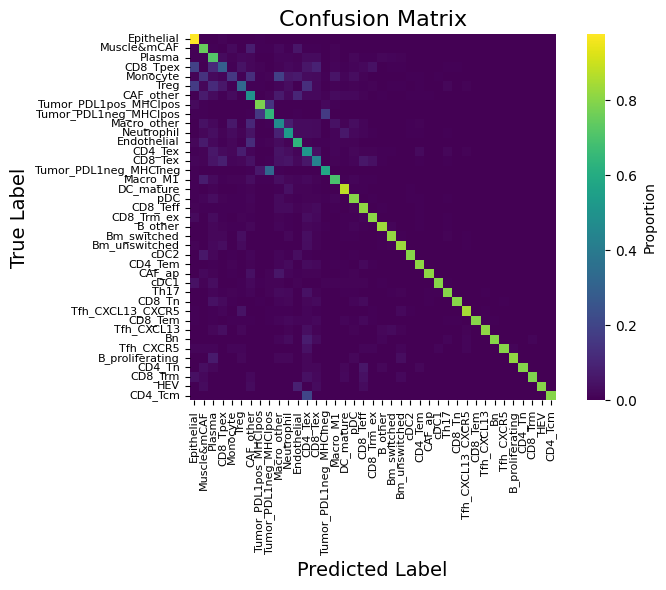

Computing confusion matrix...
Figure saved to NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_tumor1_level1_hce.pdf


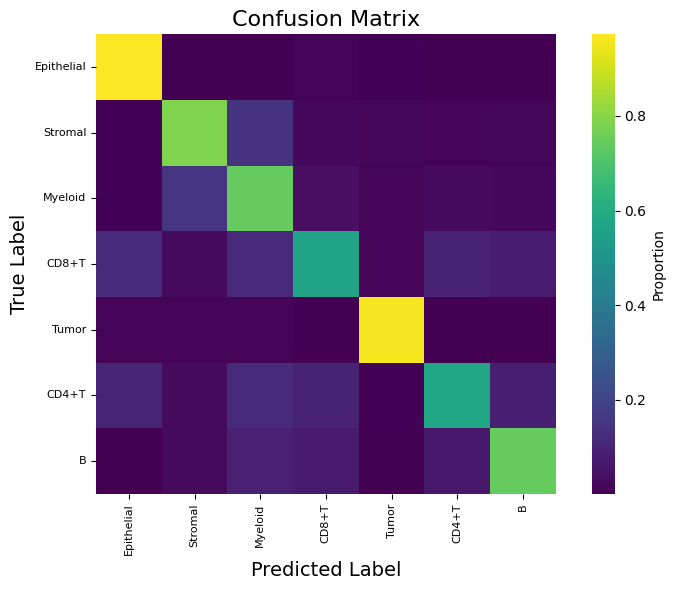

In [ ]:
# Level2 confusion matrix
plot_confusion_matrix(
    val_labels,
    val_preds,
    class_names,
    # save_path=f'{therapy_data}/{therapy_model}/{save_result}/conf_matrix_tumor1_level2_hce.pdf',
    save_path=None
)

# Level1 confusion matrix
plot_confusion_matrix(
    val_labels_level1,
    val_preds_level1,
    class_names_level1,
    # save_path=f'{therapy_data}/{therapy_model}/{save_result}/conf_matrix_tumor1_level1_hce.pdf',
    save_path=None
)

In [12]:
## Save validation metrics (row = LOGO mean over folds; acc columns are NaN)
import numpy as np

metrics_csv_path = f"{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/{save_result}/hce_validation_metrics.csv"

hce_w1_used = globals().get("hce_w1", 1.0)
hce_w2_used = globals().get("hce_w2", 1.0)
hce_w12_used = globals().get("hce_w12", 1.0)
mean_best_epoch = int(round(float(np.mean([f["best_epoch"] for f in logo_summary["folds"]]))))

metrics_df, combined_df = save_hce_validation_metrics(
    val_acc=float("nan"),
    val_macro_f1=logo_summary["l2_macro_f1_mean"],
    val_weighted_f1=logo_summary["l2_weighted_f1_mean"],
    val_level1_acc=float("nan"),
    val_level1_macro_f1=logo_summary["l1_macro_f1_mean"],
    val_level1_weighted_f1=logo_summary["l1_weighted_f1_mean"],
    class_names=class_names if "class_names" in globals() else None,
    class_names_level1=class_names_level1 if "class_names_level1" in globals() else None,
    best_epoch=mean_best_epoch,
    hce_lambda=None,
    hce_w1=hce_w1_used,
    hce_w2=hce_w2_used,
    hce_w12=hce_w12_used,
    therapy_data=f"{therapy_data}_tumor1_LOGO",
    metrics_csv_path=metrics_csv_path,
)



Current run metrics:
             timestamp      therapy_data  best_epoch hce_lambda  hce_w1  \
0  2026-04-15 23:27:26  NCRT_tumor1_LOGO          21       None     1.0   

   hce_w2  hce_w12  val_l2_accuracy  val_l2_macro_f1  val_l2_weighted_f1  \
0     2.0      1.0              NaN         0.175015            0.441359   

   val_l1_accuracy  val_l1_macro_f1  val_l1_weighted_f1  num_l2_classes  \
0              NaN         0.553522            0.591729              39   

   num_l1_classes  
0               7  

Saved comparison table to: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/hce_validation_metrics.csv
Total rows: 1


Visualizing per-class performance...
  ✓ Computed metrics for 39 classes
Figure saved to NCRT/NCRT_project_tumor1_UNI/result/f1_per_class_tumor1_level2_hce.pdf


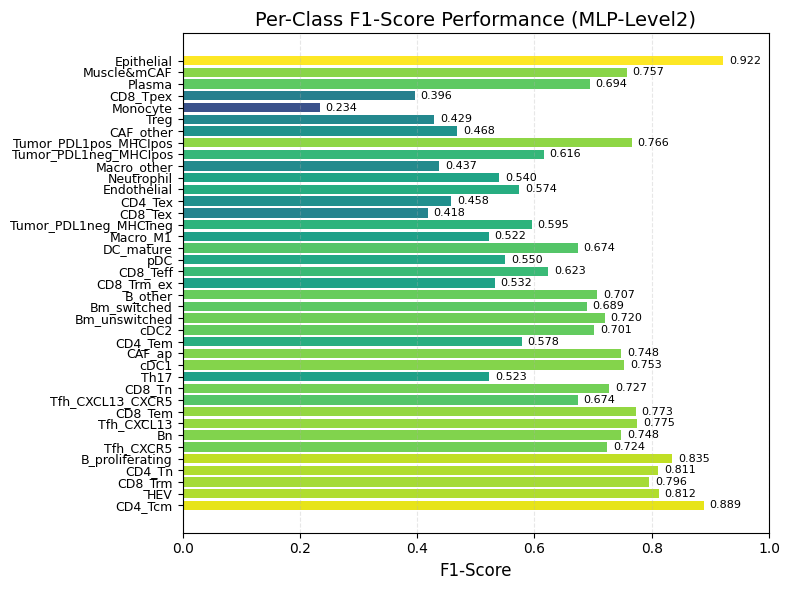


Model Summary:
  Device: cuda:2
  Total classes (before filtering): 39
  Actual classes in test set: 39
  Feature dimension: 1024
  Model parameters: 1,721,134
  Best epoch: 21
  Test Accuracy: 0.6425
  Test Macro F1: 0.6458
  Test Weighted F1: 0.6265
Visualizing per-class performance...
  ✓ Computed metrics for 7 classes
Figure saved to NCRT/NCRT_project_tumor1_UNI/result/f1_per_class_tumor1_level1_hce.pdf


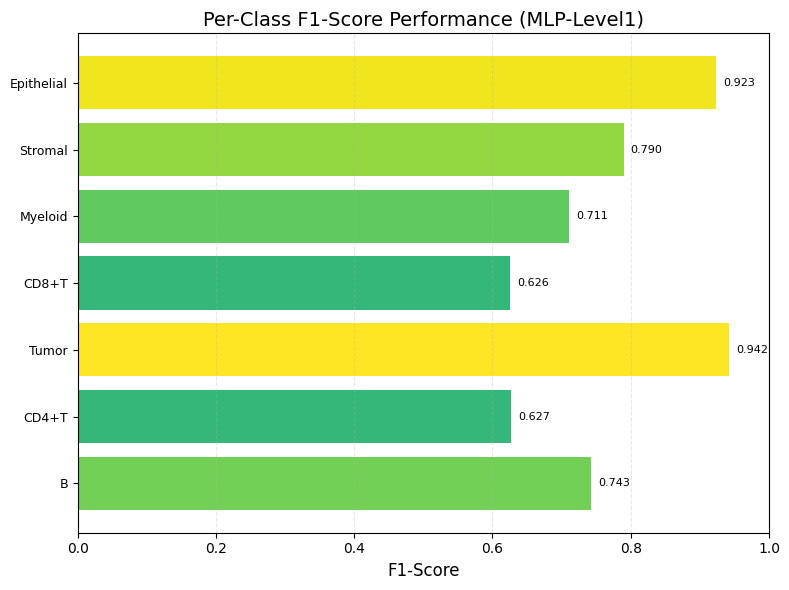


Model Summary:
  Device: cuda:2
  Total classes (before filtering): 7
  Actual classes in test set: 7
  Feature dimension: 1024
  Model parameters: 1,721,134
  Best epoch: 21
  Test Accuracy: 0.7855
  Test Macro F1: 0.7660
  Test Weighted F1: 0.7810


In [14]:
# Per-class F1 for level2
metrics_df_level2 = plot_per_class_f1(
    val_labels,
    val_preds,
    class_names,
    model=model,
    device=device,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    input_dim=input_dim,
    best_epoch=best_epoch,
    test_acc=val_acc,
    test_macro_f1=val_macro_f1,
    test_weighted_f1=val_weighted_f1,
    model_name="MLP-Level2",
    # y_sort_by="f1_asc",
    save_path=f'{therapy_data}/{therapy_model}/{save_result}/f1_per_class_tumor1_level2_hce.pdf',
    # save_path=None
)

# Per-class F1 for level1
metrics_df_level1 = plot_per_class_f1(
    val_labels_level1,
    val_preds_level1,
    class_names_level1,
    model=model,
    device=device,
    train_dataset=train_dataset,
    val_dataset=val_dataset,
    input_dim=input_dim,
    best_epoch=best_epoch,
    test_acc=val_level1_acc,
    test_macro_f1=val_level1_macro_f1,
    test_weighted_f1=val_level1_weighted_f1,
    model_name="MLP-Level1",
    # y_sort_by="f1_asc",
    save_path=f'{therapy_data}/{therapy_model}/{save_result}/f1_per_class_tumor1_level1_hce.pdf',
    # save_path=None
)

  Using provided X and y...
  X_all_scaled shape: (80302, 1024)
  y_all_encoded shape: (80302,)
  ✓ Final y_all_encoded dtype: int64
X_all_scaled:  (80302, 1024)
y_all_encoded:  (80302,)
  ⚠ Large dataset detected (80302 samples). Setting num_workers=0 to avoid indexing issues.
  Total samples: 80302
  DataLoader batch_size: 1024, num_workers: 0

Final Performance on All Data:
  Accuracy: 0.6424
  Macro F1-score: 0.6458
  Weighted F1-score: 0.6264
all_preds:  (80302,)
unique_labels:  (39,)

Detailed Classification Report:
  Number of classes: 39
                       precision    recall  f1-score   support

              B_other       0.61      0.83      0.71       426
      B_proliferating       0.86      0.81      0.83        59
          Bm_switched       0.59      0.82      0.69       376
        Bm_unswitched       0.63      0.83      0.72       354
                   Bn       0.71      0.80      0.75        69
               CAF_ap       0.69      0.81      0.75       223
      

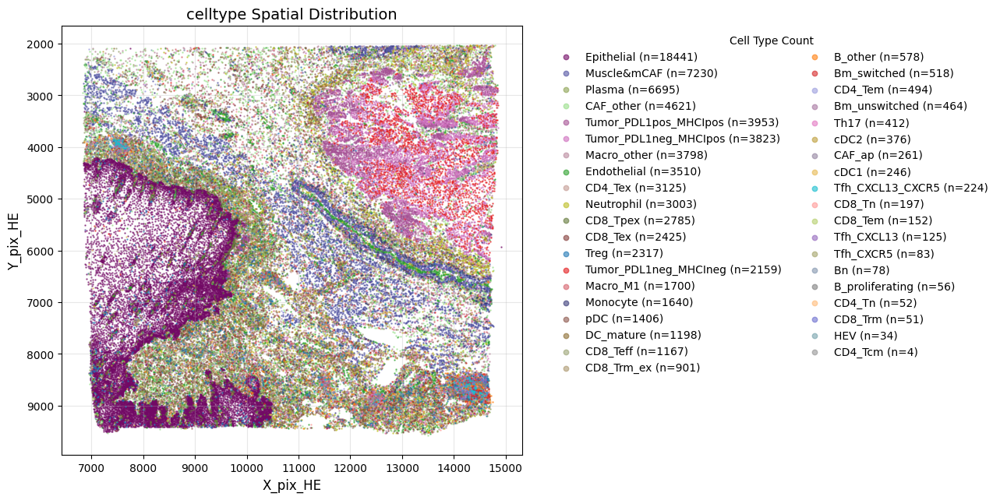

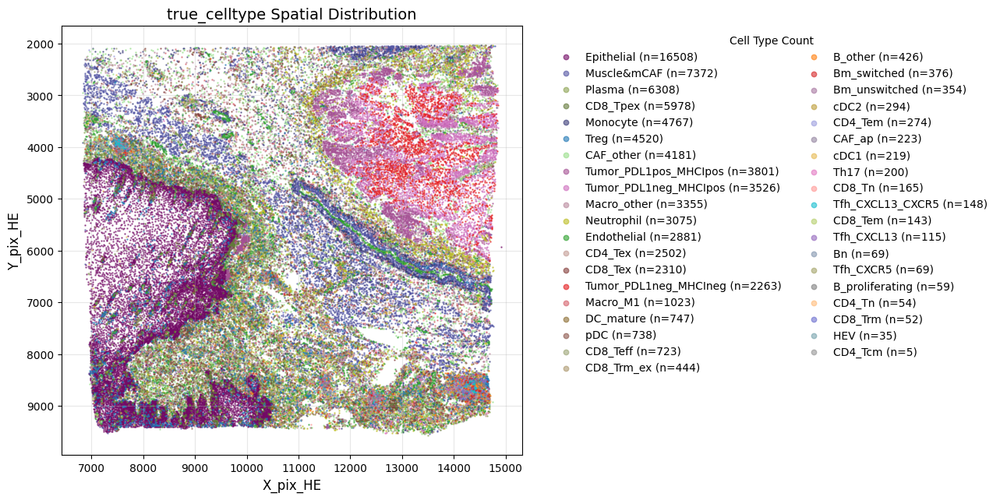

In [15]:
## Evaluate on all data and plot spatial distribution
# Skip loading npz here: rows must match ``cv_data`` filter and ``scaler`` fit on ``X_f``.
all_acc, all_macro_f1, all_weighted_f1, all_preds, all_labels = evaluate_and_plot_on_all_data(
    model=model,
    matched_features_path="",
    class_names=class_names,
    evaluate=evaluate,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    CellTypeDataset=CellTypeDataset,
    device=device,
    scaler=scaler,
    val_loader=val_loader if "val_loader" in globals() else None,
    X=cv_data["X_f"],
    y=None,
    y_encoded=cv_data["y_encoded_f"],
    X_train=None,
    X_train_scaled=X_train_scaled if "X_train_scaled" in globals() else None,
    X_test_scaled=X_test_scaled if "X_test_scaled" in globals() else None,
    y_train_encoded=y_train_encoded if "y_train_encoded" in globals() else None,
    y_test_encoded=y_test_encoded if "y_test_encoded" in globals() else None,
    min_samples_per_class=min_samples_per_class if "min_samples_per_class" in globals() else 29,
    X_coords_matched=X_coords_plot if "X_coords_plot" in globals() else None,
    celltype_pred_dir = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/{save_result}/celltype_valid_tumor1_level2_hce.jpg',
    celltype_pixel_NCRT_tumor1=celltype_pixel_NCRT_tumor1 if "celltype_pixel_NCRT_tumor1" in globals() else None,
)

  Level1 spatial plot: using distinct palette for 7 class name(s).
Number of valid data points: 80302
Number of cell types: 7
Number of valid data points: 80302
Number of cell types: 7


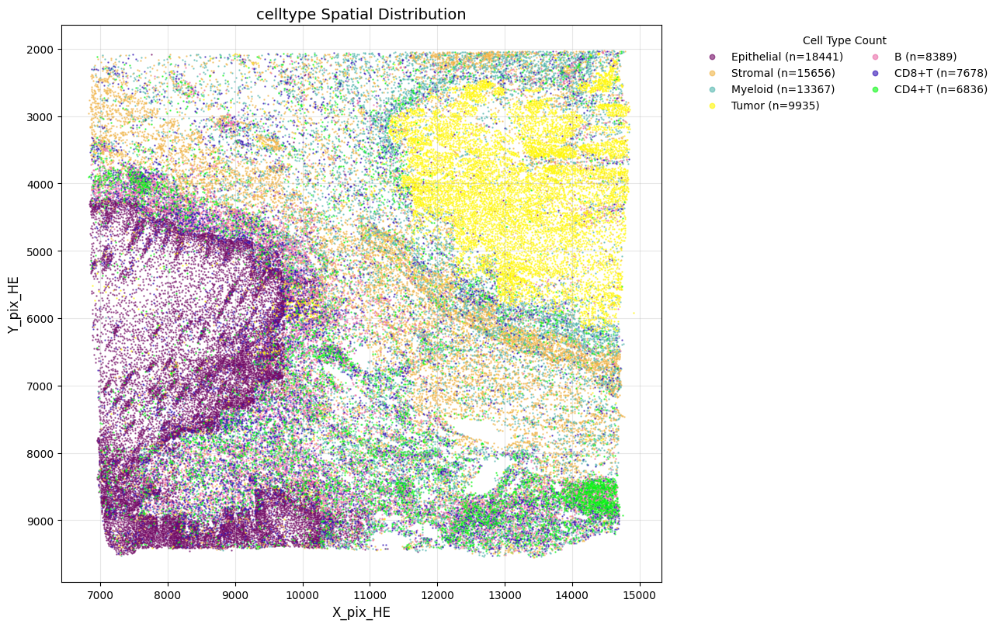

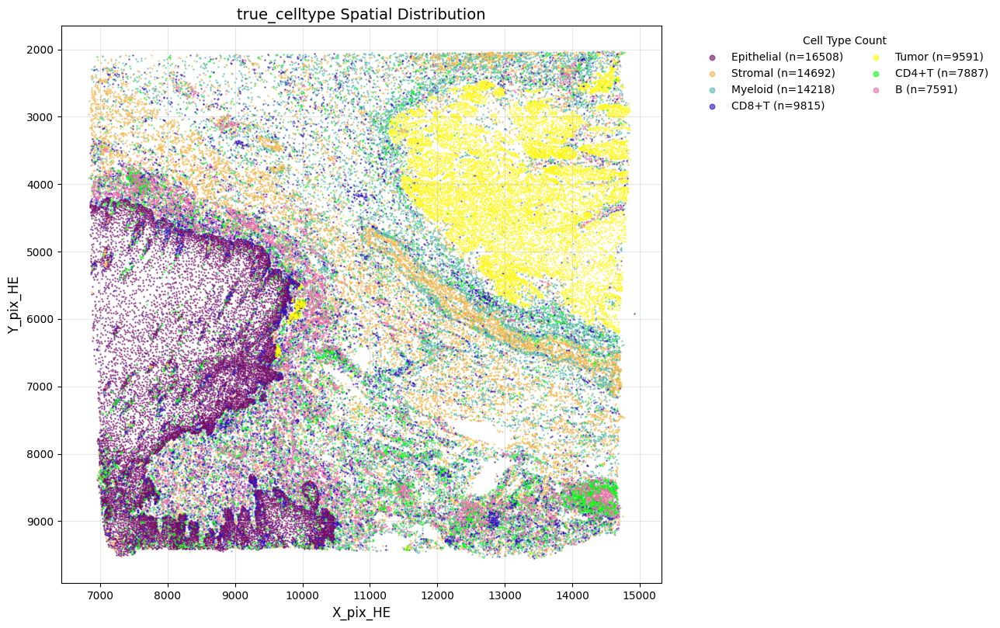

In [16]:
save_path_pred = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/{save_result}/celltype_valid_tumor1_level1_hce.jpg'
save_path_true = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/{save_result}/celltype_true_tumor1_level1_hce.jpg'
plot_level1_spatial_distribution(
    matched_features_path=matched_features_path,
    all_preds=all_preds,
    class_names_level1=class_names_level1,
    class_names=class_names,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    save_path_pred=save_path_pred,
    save_path_true=save_path_true
)

## Predict StarDist

In [17]:
## Load best model for StarDist prediction.
model_star = load_model_for_predict(path, therapy_data, therapy_model, parent_dir=True)

Loading best model for StarDist prediction...
  Checkpoint file: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/best_mlp_gpu.pt
  Inferred hidden_dims from checkpoint: [1024, 512, 256]
✓ StarDist model loaded


In [18]:
## Tumor1
# therapy_model = f'{therapy_data}_project_tumor1'
celltype_pixel_NCRT_stardist_path = f'{path}Hist2Pheno/data/CODEX/ESCC/{transfer_data}/{therapy_data}_CellPixCoords_tumor1_StarDist.csv'
embedding_star_dir = Path(f"{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/ImgEmbeddings_tumor1_stardist/sc_pth_16_16")
matched_features_star_path = f"{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/matched_features_tumor1_stardist.npz"

match_tolerance = 1.0
X_star, y_star, y_star_level1, X_coords_star = match_hist2cell_matrix(
    cell_coords_path=celltype_pixel_NCRT_stardist_path,
    hist_embedding_dir=embedding_star_dir,
    matched_features_path=matched_features_star_path,
    coord_cols=("centroid_x", "centroid_y"),   # StarDist coordinates
    tolerance=match_tolerance,
    pth_prefix=f"sc_{therapy_data}",
)

Loading celltype Ground Truth ...
  Loaded 77996 cells
  Cell types: 40 unique types

  ✓ matched_features cache found; skipping .pth directory load.
Loading pre-saved matched data...
  ✓ Loaded from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/matched_features_tumor1_stardist.npz
  X shape: (77996, 1024)
  y shape: (77996,)
  Number of classes: 40
  ✓ Coordinates found in saved data
  ✓ Coordinates loaded: (77996, 2)


  Loading data from matched_features_path...
  ✓ Loaded X from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/matched_features_tumor1_stardist.npz: (77996, 1024)
  ✓ Loaded y from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/matched_features_tumor1_stardist.npz: (77996,), dtype: <U21
  ⚠ prediction_only=True: Labels will be used for visualization only, not for evaluation.
  ✓ Keeping labels as strings for visualization (no encoding needed)
  ✓ Scaled X using provided scaler
  X_all_scaled shape: (77996, 1024)
  No labels available - prediction mode only
X_all_scaled:  (77996, 1024)
dummy_labels:  (77996,)
  ⚠ Large dataset detected (77996 samples). Setting num_workers=0 to avoid indexing issues.
  Total samples: 77996
  DataLoader batch_size: 1024, num_workers: 0
  Predicting on new data (no labels for evaluation)...


Predicting: 100%|██████████| 77/77 [00:00<00:00, 99.23it/s] 



Prediction completed:
  Total predictions: 77996
  Predicted classes: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38]
  ✓ Using original labels for visualization: 77996 labels
  ⚠ 1 true labels are not in class_names; excluding them from metric computation.
  ✓ Computed metrics in prediction_only mode from aligned true labels: acc=0.4566, macro_f1=0.2497, weighted_f1=0.4378

Preparing spatial distribution plot...
  Matching predictions with coordinates...
  ✓ Loaded coordinates from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/matched_features_tumor1_stardist.npz: (77996, 2)
  Coordinates shape: (77996, 2)
  Predictions shape: (77996,)
  ✓ Created prediction DataFrame with 77996 cells

Plotting spatial distribution of PREDICTED cell types...
Number of valid data points: 77996
Number of cell types: 39

Plotting spatial distribution of TRUE cell types (for comparison)...
Number of va

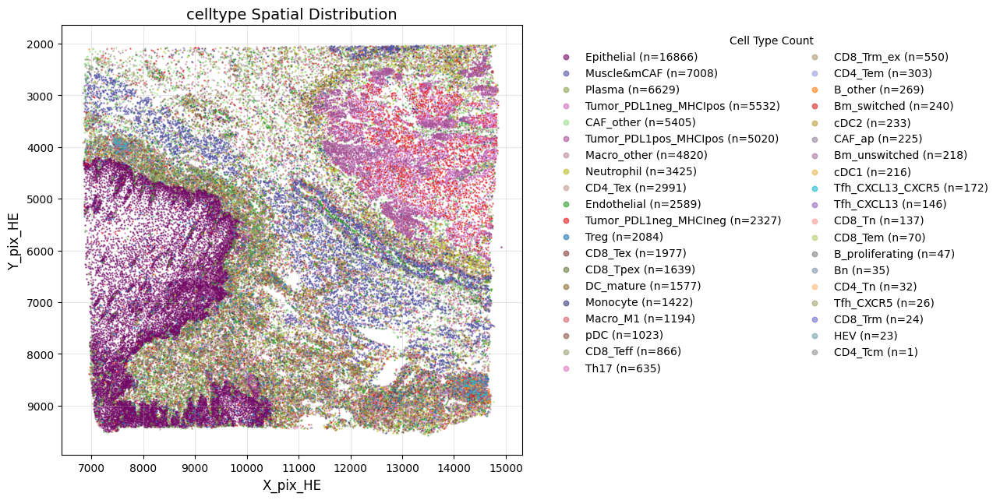

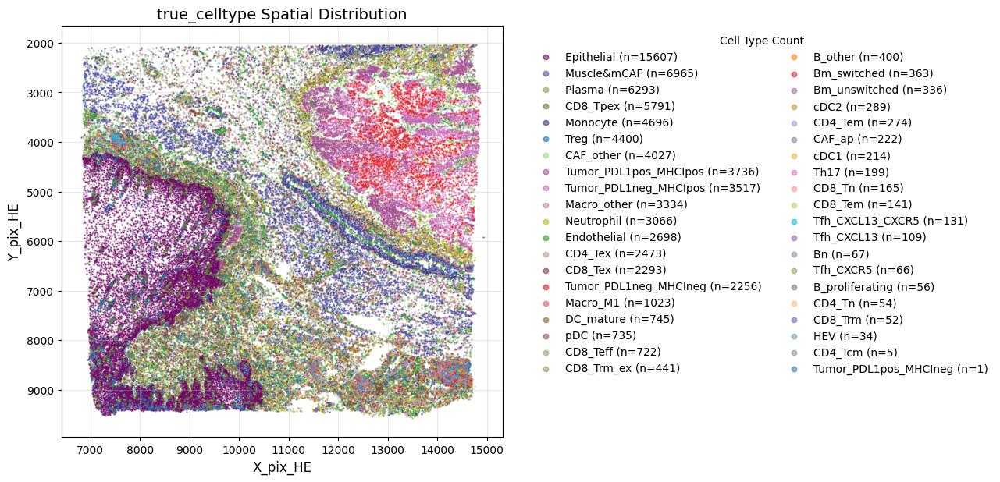

In [19]:
# Predict on StarDist-matched data and plot spatial distribution (level2 + level1).
class_names_star = class_names if "class_names" in globals() and class_names is not None else [
    str(i) for i in range(num_classes_star)
]

all_acc, all_macro_f1, all_weighted_f1, all_preds, all_labels = evaluate_and_plot_on_all_data(
    model=model_star,
    matched_features_path=matched_features_star_path,
    class_names=class_names_star,
    evaluate=evaluate,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    CellTypeDataset=CellTypeDataset,
    device=device,
    scaler=scaler,
    val_loader=None,
    prediction_only=True,
    # Optional coordinate fallback when X_coords are missing in npz.
    X_coords_matched=X_coords_star if "X_coords_star" in globals() else None,
    celltype_pred_dir=f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/{save_result}/celltype_pred_tumor1_level2_hce.jpg',
    celltype_pixel_NCRT_tumor1=celltype_pixel_NCRT_stardist if "celltype_pixel_NCRT_stardist" in globals() else None,
)

  Level1 spatial plot: using distinct palette for 7 class name(s).
Number of valid data points: 77996
Number of cell types: 7
Number of valid data points: 77996
Number of cell types: 7
Saved StarDist level1 predicted/true spatial plots.


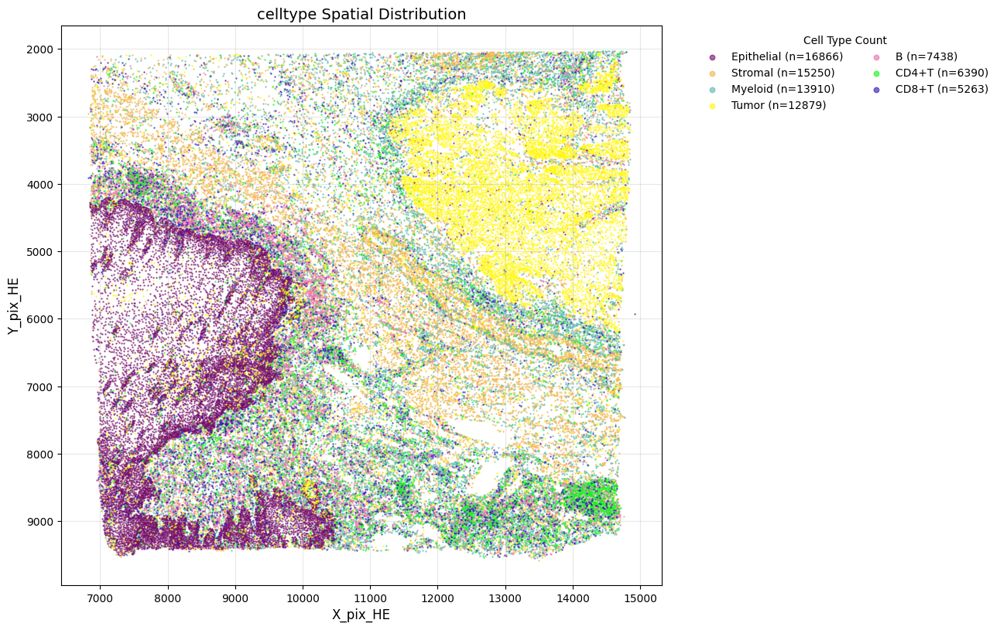

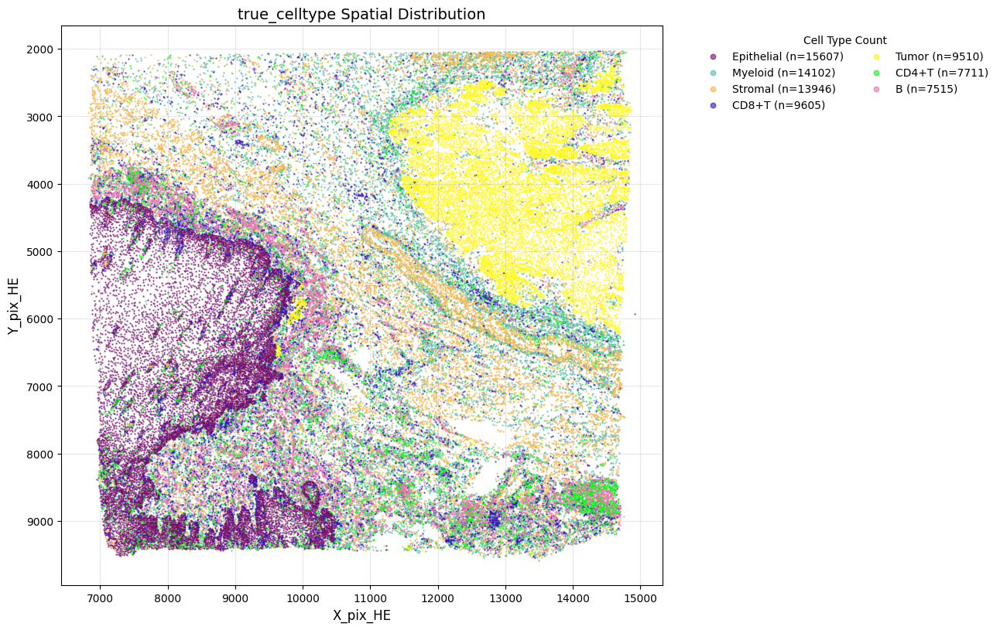

In [20]:
save_path_pred = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/{save_result}/celltype_pred_tumor1_level1_hce.jpg'
save_path_true = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/{save_result}/celltype_true_tumor1_level1_hce.jpg'

plot_level1_spatial_distribution(
    matched_features_path=matched_features_star_path,
    all_preds=all_preds,
    class_names_level1=class_names_level1,
    class_names=class_names,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    save_path_pred=save_path_pred,
    save_path_true=save_path_true
)
print("Saved StarDist level1 predicted/true spatial plots.")

Visualizing per-class accuracy...
  ✓ Computed metrics for 40 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/acc_tumor1_level2_stardist_hce.pdf


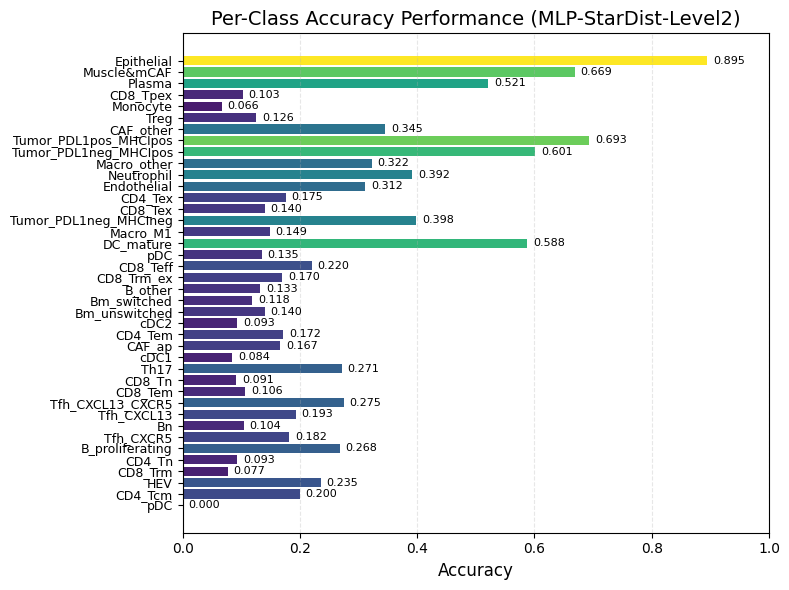


Model Summary:
  Device: cuda:2
  Total classes (before filtering): 39
  Actual classes in test set: 40
  Model parameters: 1,721,134
  Test Accuracy: 0.4566
  Test Macro F1: 0.2497
  Test Weighted F1: 0.4378
  Level1 metrics from level2 preds: acc=0.5924, macro_f1=0.5442, weighted_f1=0.5755
Visualizing per-class accuracy...
  ✓ Computed metrics for 7 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/acc_tumor1_level1_stardist_hce.pdf


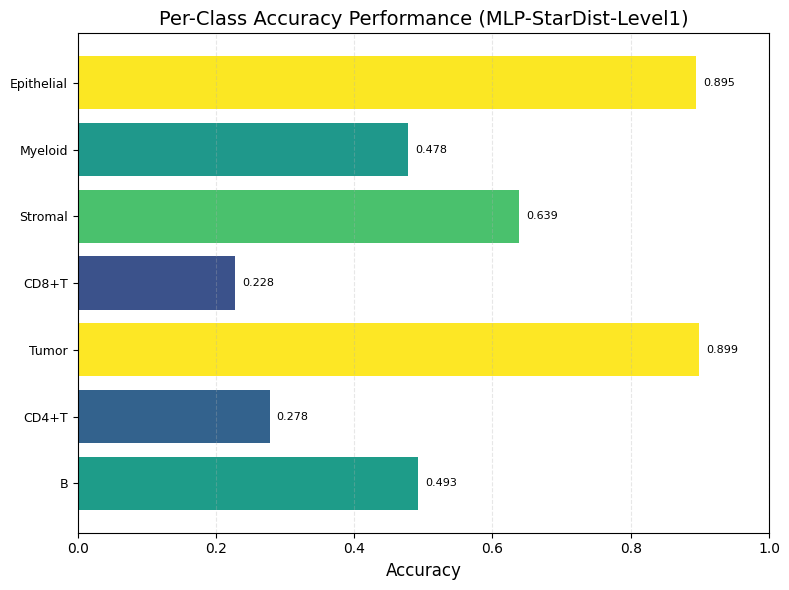


Model Summary:
  Device: cuda:2
  Total classes (before filtering): 7
  Actual classes in test set: 7
  Model parameters: 1,721,134
  Test Accuracy: 0.5924
  Test Macro F1: 0.5442
  Test Weighted F1: 0.5755


In [21]:
metrics_acc_star = plot_per_class_accuracy(
    all_labels,
    all_preds,
    class_names_star,
    model=model_star,
    device=device,
    train_dataset=None,
    val_dataset=None,
    input_dim=None,
    best_epoch=None,
    test_acc=all_acc,
    test_macro_f1=all_macro_f1,
    test_weighted_f1=all_weighted_f1,
    model_name="MLP-StarDist-Level2",
    save_path=f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/{save_result}/acc_tumor1_level2_stardist_hce.pdf',
)

metrics_acc_star_l1 = plot_level1_accuracy_from_level2_predictions(
    matched_features_path=matched_features_star_path,
    all_preds=all_preds,
    class_names=class_names,
    class_names_level1=class_names_level1,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_per_class_accuracy=plot_per_class_accuracy,
    model=model_star,
    device=device,
    model_name="MLP-StarDist-Level1",
    save_path=f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/{save_result}/acc_tumor1_level1_stardist_hce.pdf',
)

Computing confusion matrix...
Figure saved to NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_tumor1_level2_stardist_hce.pdf


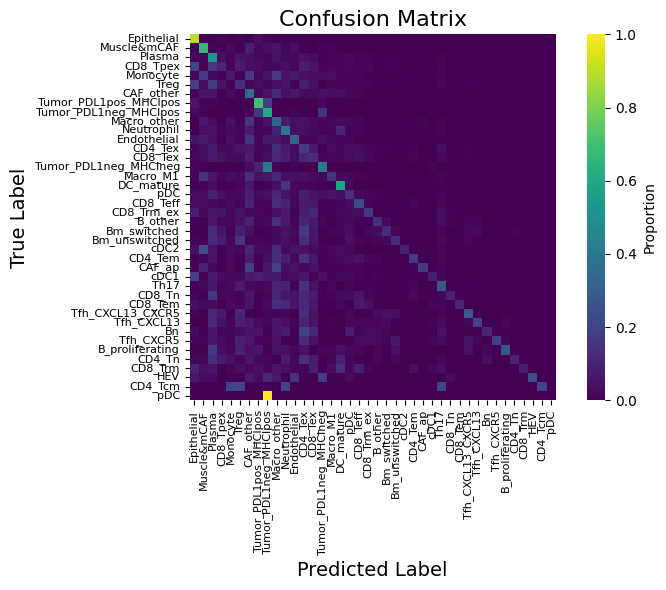

Computing confusion matrix...
Figure saved to NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_tumor1_level1_stardist_hce.pdf


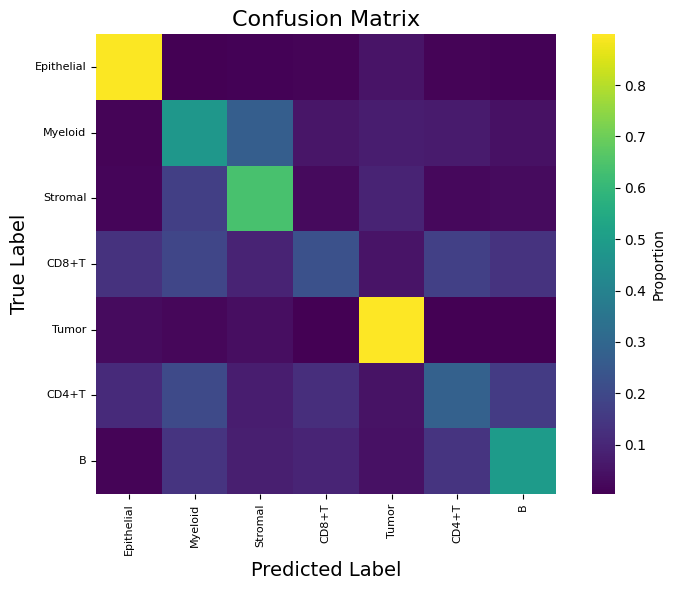

In [22]:
# StarDist prediction heatmaps (confusion matrices): level2 + level1
plot_confusion_matrix(
    all_labels,
    all_preds,
    class_names_star,
    save_path=f'{therapy_data}/{therapy_model}/{save_result}/conf_matrix_tumor1_level2_stardist_hce.pdf',
)

_loaded_star = np.load(matched_features_star_path, allow_pickle=True)
if "y_level1" in _loaded_star:
    _y_true_l1_raw = _loaded_star["y_level1"]
    _child_to_parent = np.full(len(class_names_star), -1, dtype=np.int64)
    for _l2, _l1 in zip(y_encoded_f, y_level1_encoded_f):
        _l2_i, _l1_i = int(_l2), int(_l1)
        if _child_to_parent[_l2_i] == -1:
            _child_to_parent[_l2_i] = _l1_i
    _preds_l1 = _child_to_parent[np.asarray(all_preds, dtype=np.int64)]

    if getattr(_y_true_l1_raw, "dtype", None) is not None and _y_true_l1_raw.dtype.kind in ["U", "S", "O"]:
        _name_to_idx = {str(c): i for i, c in enumerate(class_names_level1)}
        _y_true_l1 = np.array([_name_to_idx.get(str(v), -1) for v in _y_true_l1_raw], dtype=np.int64)
    else:
        _y_true_l1 = np.asarray(_y_true_l1_raw, dtype=np.int64)

    _n = min(len(_y_true_l1), len(_preds_l1))
    _y_true_l1 = _y_true_l1[:_n]
    _preds_l1 = _preds_l1[:_n]
    _valid = _y_true_l1 >= 0

    if np.any(_valid):
        plot_confusion_matrix(
            _y_true_l1[_valid],
            _preds_l1[_valid],
            class_names_level1,
            save_path=f'{therapy_data}/{therapy_model}/{save_result}/conf_matrix_tumor1_level1_stardist_hce.pdf',
        )
    else:
        print("Skip level1 StarDist confusion matrix: no valid y_level1 labels.")
else:
    print(f"Skip level1 StarDist confusion matrix: y_level1 not found in {matched_features_star_path}")
